## Case : Employment rate map
Goal: Plot an Interactive map of employment rates across Finnish regions

In [1]:
# import modules
import folium 
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

Employment Rate:<br>
Employment rate refers to "The proportion of the employment amoung persons aged 15 to 64".  Data from Statistics Findland 

In [2]:
# Read csv file
fp = "data/seutukunta_tyollisyys_2013.csv"

data = pd.read_csv(fp, sep=',')
data.head()
# data.shape

,seutukunta,seutukunta_nimi,tyollisyys
0,SK011,Helsingin seutukunta,73.0
1,SK014,Raaseporin seutukunta,70.3
2,SK015,Porvoon seutukunta,74.3
3,SK016,Loviisan seutukunta,71.5
4,SK021,Åboland-Turunmaan seutukunta,72.9


## Sub-regional units
The spatial data for the sub-regional units (Seutukunnat in Finnish) can be retrieved from the Statistics Finland Web Feature Service http://geo.stat.fi/geoserver/tilastointialueet/wfs

In [3]:
# A layer saved to GeoJSON in QGIS
# geodata= gpd.read_file('Seutukunnat_2018.geojson')

# Get the feature directly from the vfs
url = "http://geo.stat.fi/geoserver/tilastointialueet/wfs?request=GetFeature&typename=tilastointialueet:seutukunta1000k_2018&outputformat=JSON"
geodata = gpd.read_file(url)

In [4]:
geodata.head()
# geodata.shape

,id,vuosi,seutukunta,nimi,namn,name,geometry
0,seutukunta1000k_2018.1,2018,011,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969..."
1,seutukunta1000k_2018.2,2018,014,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668..."
2,seutukunta1000k_2018.3,2018,015,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175..."
3,seutukunta1000k_2018.4,2018,016,Loviisa,Lovisa,Loviisa,"MULTIPOLYGON (((444038.768 6703649.355, 444155..."
4,seutukunta1000k_2018.5,2018,021,Åboland-Turunmaa,Åboland-Turunmaa,Åboland-Turunmaa,"MULTIPOLYGON (((190999.717 6715878.622, 191021..."


### Join attributes and Geometries
Join attribute using a commun column between the two datas, this column is called `"seutukunta"`.<br>
Column named: `"seutukunta"` --> Region codes, in dataset data contains 2 letters 'SK', which we need to remove before joining, 

In [5]:
data['seutukunta'] = data['seutukunta'].apply(lambda x: x[2:])
# check that "SK" where removed
data['seutukunta'].head(2)


0    011
1    014
Name: seutukunta, dtype: object

Now we can Join the two datasets base on `'seutukunta'` -column. Also check before and after the join of the datasets the number of records 

In [8]:
print(f'Number of rows from attributes: {len(data)}')
print(f'Number of rows from geometries: {len(geodata)}')

# Merge or Join the data
geodata = geodata.merge(data, on='seutukunta')

# Print info
print(f'Count after the join: {len(geodata)}')

geodata.head(2)

Number of rows from attributes: 70
Number of rows from geometries: 70
Count after the join: 70


,id,vuosi,seutukunta,nimi,namn,name,geometry,seutukunta_nimi,tyollisyys
0,seutukunta1000k_2018.1,2018,011,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969...",Helsingin seutukunta,73.0
1,seutukunta1000k_2018.2,2018,014,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668...",Raaseporin seutukunta,70.3


## Create and Static Map

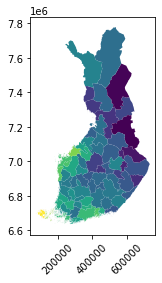

In [9]:
geodata.plot(column='tyollisyys')
plt.xticks(rotation=45)
plt.show()

Now let's customize the plot a little bit

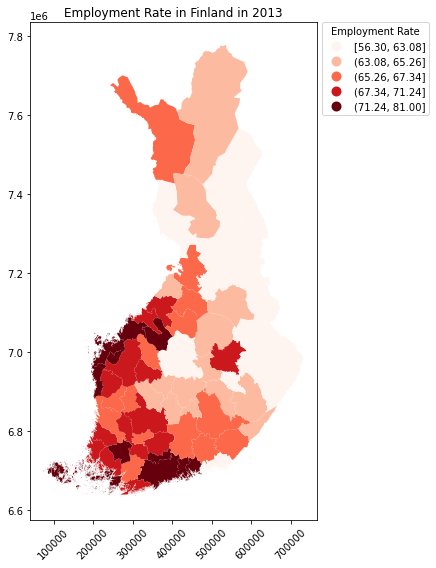

In [10]:
# define legend
lgnd_kwds = {'title':'Employment Rate'
             , 'loc': 'upper left', 'bbox_to_anchor': (1, 1.01), 'ncol': 1}

# Create plot
f, ax = plt.subplots(1, figsize=(10,8))
geodata.plot(ax=ax, column='tyollisyys', scheme='quantiles', cmap='Reds', legend=True, legend_kwds=lgnd_kwds)
plt.title("Employment Rate in Finland in 2013")
plt.xticks(rotation=45)

# remove empty white space around axes
plt.tight_layout()
plt.show()

## Interactive Map #1

In [11]:
# Create a geoid column to add to the geodata GeoDataFrame
geodata['geoid'] = geodata.index.astype(str)

In [54]:
# Create a m instance
m = folium.Map(location=[60.25, 24.8]
              ,tiles= "Stamen Terrain"
              ,zoom_start=8
              ,control_scale=True)

# define Choropleth 
folium.Choropleth(
    geo_data=geodata
    ,data= geodata
    ,name='Sub-regions' # label name to show in the label widget
    ,columns=['geoid', 'tyollisyys'] 
    ,key_on= 'feature.id'
    ,fill_color='RdYlBu'
    ,line_color='white'
    ,line_weight=0
    ,legend_name="Employment Rate in Finland"
).add_to(m)

# Call the map instance
m


## Interactive Map #2

__We can also use Tooltip providing more visualization options__

In [55]:
"""
Re-use the map instance created in the previous cell
"""

# Define the style function : popup style
style_function= lambda x: {'color':'transparent', 'fillColor':'transparent', 'weight': 0}


folium.features.GeoJson(geodata
                        ,name='Labels' # name of the layer in the Layer control
                       ,style_function= style_function 
                        # Display text (define what value to show)
                       ,tooltip=folium.features.GeoJsonTooltip(fields=['tyollisyys'] # colunm field to display in the popup
                                                              ,aliases=['Employment rate'] 
                                                              ,sticky=False # 
                                                              )  
                       ).add_to(m)

folium.LayerControl().add_to(m) # control labels to display 


In [58]:
# save the map
output = 'maps/joinAttr&GeomChoroplethMap.html'
m.save(output)

# call map instance
m

## Interactive Map #3

__Create Style function with a classification scheme__

In [65]:
import branca

# Creaate a series (or dictionary?) put of the variable that you want to map
employment_series= data.set_index('seutukunta')['tyollisyys']

# Set colorscale
colorscale= branca.colormap.linear.RdYlBu_05.to_step(data= geodata['tyollisyys'], n=6 , method='quantiles')

# Define style function
def my_color_function(feature):
    employed= employment_series.get(int(feature['id']), None)
    
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }


In [79]:
employment_series.name

'tyollisyys'

## Plot the polygons, apply the classification scheme and add tooltips

* Based on :
    * [Folium: quick start](https://python-visualization.github.io/folium/quickstart.html)
    * [Folium: Colormaps](https://github.com/python-visualization/folium/blob/master/examples/Colormaps.ipynb)


In [68]:
# Create a map instance
m= folium.Map(location=[60.25, 24.8], tiles = 'cartodbpositron', zoom_start=6, control_scale=True)

# Add GeoJson layer on the map, which visualize the polygons based on your style function and additional parameters
folium.GeoJson(
    geodata,
    name='Employment Rate in Finland (2013)',
    style_function= my_color_function,
    tooltip=folium.features.GeoJsonTooltip(fields=['nimi', 'tyollisyys'],
                                          aliases=['Region', 'Employment rate (%)'],
                                          labels=True,
                                          sticky=True
                                          )
).add_to(m)


# Add legend
colorscale.caption = 'Employment rate (%)'
m.add_child(colorscale)

# Create a layer control object and add it to our map instance
folium.LayerControl().add_to(m)



In [80]:
# save the map
output = 'maps/joinAttr&GeomChoroplethMapColorScale.html'
m.save(output)
#Show map
m